In [13]:
from sklearn.datasets import load_diabetes
from sklearn.model_selection import train_test_split
import numpy as np
import pandas as pd
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.datasets import load_diabetes
from numpy import asarray

In [48]:
class LinearRegression:
    '''
    A class which implements linear regression model with gradient descent.
    '''
    def __init__(self, learning_rate=0.1, n_iterations=1000):
        self.learning_rate = learning_rate
        self.n_iterations = n_iterations
        self.weights, self.bias = None, None
        self.loss = []
        
    @staticmethod
    def _mean_squared_error(y, y_hat):
        '''
        Private method, used to evaluate loss at each iteration.
        
        :param: y - array, true values
        :param: y_hat - array, predicted values
        :return: float
        '''
        error = 0
        for i in range(len(y)):
            error += (y[i] - y_hat[i]) ** 2
        return error / len(y)
    
    def fit(self, X, y):
        '''
        Used to calculate the coefficient of the linear regression model.
        
        :param X: array, features
        :param y: array, true values
        :return: None
        '''
        # 1. Initialize weights and bias to zeros
        self.weights = np.zeros(X.shape[1])
        self.bias = 0
        
        # 2. Perform gradient descent
        for i in range(self.n_iterations):
            # Line equation
            y_hat = np.dot(X, self.weights) + self.bias
            print("printing y_hat",y_hat)
            print("printing y",y)
            loss = self._mean_squared_error(y, y_hat)
            
            self.loss.append(loss)
            
            # Calculate derivatives
            partial_w = (1 / X.shape[0]) * (2 * np.dot(X.T, (y_hat - y)))
            print("partial_w printing",partial_w)
            partial_d = (1 / X.shape[0]) * (2 * np.sum(y_hat - y))
            print("partial_d printing", partial_d)
            # Update the coefficients
            self.weights -= self.learning_rate * partial_w
            self.bias -= self.learning_rate * partial_d
            
        print("printing y_hat", y_hat)
        print("printing weights", self.weights)
        print("printing bias", self.bias)
    def predict(self, X):
        '''
        Makes predictions using the line equation.
        
        :param X: array, features
        :return: array, predictions
        '''
        return np.dot(X, self.weights) + self.bias

In [62]:
from sklearn.preprocessing import OrdinalEncoder
df = pd.read_csv('Fish.csv',index_col=None)
data1 = df['Species'].to_numpy()
data1 = data1.reshape(-1,1)
encoder = OrdinalEncoder()
result1 = encoder.fit_transform(data1)
df['Species'] = result1
y = np.array(df['Weight'])
df_features = df.drop(['Weight'],axis=1)
dataset = df_features.to_numpy()
X_train, X_test, y_train, y_test = train_test_split(dataset, y, test_size=0.2, random_state=42)


In [69]:

# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler

# fit scaler on training data
norm = MinMaxScaler().fit(X_train)

# transform training data
X_train = norm.transform(X_train)

# transform testing dataabs
X_test = norm.transform(X_test)
# data = load_diabetes()
# X = data.data
# y = data.target

In [70]:
# X_train = (X_train*100).astype(int)
# X_test = (X_test*100).astype(int)
# y = np.array(y_train).astype(int)

In [71]:
print(X_train)

[[3.33333333e-01 1.45631068e-01 1.41818182e-01 1.41891892e-01
  1.56141626e-01 2.23128187e-01]
 [5.00000000e-01 6.93203883e-01 6.83636364e-01 6.73986486e-01
  3.46796010e-01 5.59866412e-01]
 [0.00000000e+00 3.18446602e-01 3.29090909e-01 3.76689189e-01
  6.20049815e-01 5.33705414e-01]
 [3.33333333e-01 2.42718447e-01 2.47272727e-01 2.48310811e-01
  2.46570771e-01 3.39852271e-01]
 [6.66666667e-01 2.52427184e-01 2.56363636e-01 2.78716216e-01
  3.01593355e-01 4.01952673e-01]
 [6.66666667e-01 2.31067961e-01 2.29090909e-01 2.51689189e-01
  2.46844871e-01 3.22822800e-01]
 [1.66666667e-01 2.38834951e-01 2.38181818e-01 2.58445946e-01
  4.62656863e-01 3.02182841e-01]
 [3.33333333e-01 5.65048544e-01 5.56363636e-01 5.48986486e-01
  6.23237716e-01 9.33160832e-01]
 [0.00000000e+00 4.75728155e-01 4.83636364e-01 5.37162162e-01
  8.57444197e-01 7.43399576e-01]
 [5.00000000e-01 6.69902913e-01 6.65454545e-01 6.62162162e-01
  2.97219673e-01 5.63777774e-01]
 [8.33333333e-01 4.85436893e-02 3.81818182e-02 4.7

In [72]:
print(y_train)

[  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]


In [73]:
# from sklearn.model_selection import train_test_split
# import numpy as np
# import matplotlib.pyplot as plt
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# X_train.shape


print(type(y_train))

<class 'numpy.ndarray'>


In [74]:
model = LinearRegression()
model.fit(X_train, y_train)
preds = model.predict(X_test)

printing y_hat [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0.]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  165

  238.49064459  404.85283655]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [ -5.0375355  -12.94831603 -12.71230731 -11.2387

  208.93436858  396.12146067]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-6.82647011 -4.75132981 -4.59376764 -3.70458558

printing y_hat [  -1.64384611  756.36455102  400.63530731  170.05634615  225.6391906
  159.87428441  187.11622525  793.48548152  690.71888205  729.82576388
 -208.23703048  196.6124943   166.25523691   65.05632147  153.88186036
  625.61811464  165.49849593   83.23691836  701.60348587  523.28349833
  565.76719266  251.6245642   906.69307041  696.54334042 -183.92557703
  858.97972293  158.77507175  479.01242773  654.57175481  840.11698861
  953.83623863  354.92869071  180.9424003   535.91502903  194.90801796
  520.17839422  335.9113741   706.78025625  110.08382005  197.3881819
  160.05741312  720.53424952  154.74245897  727.09872744  689.00391143
  682.81535863  680.95315429   84.84942435  154.47559147 1125.91046778
  339.99648836 -160.75997904  543.14175244  221.0143696   790.22529697
  -25.11326381  -97.23712743  861.56407543  420.45271573 -185.213999
  828.59368331  -11.62884408  -78.47709038  235.99279852  291.54441003
  388.64966966  490.10498112  677.76746338  759.05657202  239.7397

partial_w printing [-2.55140613 -1.16025075 -1.10542342 -0.67757995 -0.28172149 -0.06310511]
partial_d printing 2.273477411247965
printing y_hat [ -10.4455783   767.83573698  390.29069524  164.45128106  228.09211958
  161.46277107  177.40562084  798.06248563  685.25749637  740.80402707
 -209.00766039  191.23753814  156.20988698   64.92172835  147.81001223
  619.60538789  159.54538874   76.37300377  704.75161826  515.43987069
  566.56049576  242.8656587   913.97098058  691.45338206 -184.19820098
  865.52409451  160.21587067  470.23127123  664.10135521  837.13925885
  968.71726902  352.58456004  170.89223501  528.11004406  189.76364761
  526.79368758  324.87599648  710.95609359   99.02124611  199.54647843
  154.0238268   715.57735677  156.03449267  729.69973231  683.52391004
  677.37020856  684.21416446   77.53805011  155.59679667 1145.16085438
  337.58564837 -160.57300624  550.38311509  223.58652106  795.1306566
  -38.60979461 -107.54524835  859.22159566  419.51062149 -185.68641612
  83

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-1.68039936 -0.66132858 -0.62361842 -0.25932488 -0.68218465  0.2093163 ]
partial_d printing 1.4210658946377326
printing y_hat [ -14.88661068  772.88483873  385.43730702  161.54767141  229.64034655
  162.56485323  173.07492095  800.04100688  683.04856842  745.45381244
 -208.88149221  188.17922395  151.45419536   65.20834296  144.57986998
  617.17181347  156.51459029   72.85451031  705.8894726   512.07118934
  566.69149288  238.96149867  917.0946846   689.49527734 -183.88129486
  868.28502918  161.24352409  465.97884797  668.31104819  836.36448803
  975.19698253  351.09777319  166.28369756  524.66736141  186.98034599
  529.58464426  319.69961136  712.80190649   93.87565269  200.9534816
  150.78457676  713.67385912  157.07075941  730.50626887  681.31060473
  674.97460158  685.45637573   73.86855891  156.4543055  1153.71024725
  336.07541539 -160.05479816  553.48330245  225.06890824  797.20403684
  -45.00624599 -112.725

  189.06589439  387.60087862]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-1.18407005 -0.40828257 -0.37942073 -0.04171095

printing y_hat [ -19.66934597  776.8478678   381.16789218  158.2771608   231.70859482
  164.14485213  169.70124706  801.47640171  682.00291612  748.66853638
 -208.01639573  184.16423128  147.08804034   66.01732163  140.75714537
  616.02528228  153.19428806   68.97582415  706.17464715  509.88883621
  566.27060369  235.92753904  919.34860407  688.86659057 -182.93317808
  870.16771196  162.7374886   461.97561668  671.651254    837.23990199
  980.09701808  348.88296794  162.37588268  522.20038533  183.6069948
  531.4720402   315.15682361  714.29496702   89.34444903  202.89595379
  146.88918119  713.06358457  158.7450288   730.26859949  680.27053368
  673.32777527  685.97752537   69.958631    157.73400806 1160.63204809
  333.86632646 -158.95024237  555.70227121  226.81396203  798.6127639
  -50.93935277 -118.2547189   859.77233737  417.0079009  -184.48282069
  839.77368046  -36.8558864   -74.51535587  226.20040328  283.23088622
  400.03337094  474.53301251  683.00517186  767.1516256   247.01

  186.88237227  385.77135223]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.6398827  -0.19646817 -0.17518587  0.15792995

partial_w printing [-0.52145601 -0.17330415 -0.15289987  0.18883368 -0.85095914  0.48065666]
partial_d printing 0.3586275996763863
printing y_hat [ -22.22235463  777.78561278  379.77031428  156.40396582  233.11051244
  165.30892914  169.15203303  801.48838788  682.67099596  748.88812776
 -206.88952294  181.29905066  145.48437566   66.87226452  138.37273231
  616.84000239  151.35372866   66.86060272  705.34836535  510.12036919
  565.45007758  235.42219057  919.45699977  689.92911742 -181.87660635
  870.10871538  163.83839132  460.3610055   672.51829771  839.28977111
  980.9284633   347.11036911  161.28669125  522.05853298  181.4517424
  531.58430058  313.73254638  714.64795723   87.90263202  204.28008126
  144.39682594  714.06685953  160.10371063  728.90011683  680.95126785
  673.29485797  685.4480923    67.90790212  158.666414   1162.46949898
  332.14701602 -157.86450044  556.01244163  227.81674947  798.52054515
  -53.18681604 -121.14023706  861.85089007  415.43176386 -183.37303911
  8

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.43634639 -0.16702016 -0.14688425  0.20601526 -0.79054123  0.47745081]
partial_d printing 0.2906836330595418
printing y_hat [ -23.08186838  777.90471303  379.48808748  155.74596627  233.6316602
  165.76610429  169.26775745  801.28087572  683.16140866  748.6838308
 -206.34928969  180.15013129  145.11489922   67.25003341  137.48216291
  617.45083798  150.71244077   66.15194549  704.80807299  510.52671503
  565.01128029  235.51167171  919.21988459  690.60442868 -181.38671304
  869.82692847  164.26632111  459.92149999  672.67349904  840.32940572
  980.85610473  346.371113    161.14911483  522.27717219  180.64273235
  531.4725741   313.48667055  714.67063428   87.64975258  204.8159446
  143.45021597  714.69506036  160.65645107  728.07801282  681.44793464
  673.4590872   685.06718643   67.22472682  159.01627475 1162.76167259
  331.44490649 -157.37657855  555.98018817  228.15478807  798.26777306
  -53.72618839 -122.08943

partial_d printing 0.24490863338443777
printing y_hat [ -23.78191944  777.96821098  379.31655347  155.20131124  234.0643078
  166.15743328  169.47348046  801.02022876  683.64552173  748.45102031
 -205.84861926  179.14083501  144.87504038   67.58592127  136.72170245
  618.06986491  150.17968124   65.58253024  704.25875118  510.97569275
  564.58543145  235.67716807  918.92093096  691.2634201  -180.93661874
  869.49787386  164.62925941  459.5914495   672.7871101   841.29160802
  980.70116579  345.71601801  161.11726766  522.54615382  179.95358172
  531.35588025  313.36912879  714.65867472   87.52893568  205.27253203
  142.63538991  715.30082107  161.13489489  727.24601781  681.93757189
  673.64438057  684.67819515   66.67029198  159.30400374 1162.93287678
  330.83041506 -156.9318696   555.93658749  228.42295044  797.97147857
  -54.08672854 -122.85154451  863.8591043   414.12229632 -182.38613148
  840.9765095   -40.27932658  -72.5350913   222.87763115  279.51787242
  403.03010061  474.1716

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.32757501 -0.1740759  -0.15372308  0.22223682 -0.66727613  0.45069085]
partial_d printing 0.2099545776227329
printing y_hat [ -24.40482221  778.02698706  379.19549747  154.71166093  234.44836164
  166.51497214  169.73150644  800.71898644  684.12435335  748.22212349
 -205.36168829  178.18995633  144.70124788   67.90042155  136.01973644
  618.70011265  149.69707332   65.08516397  703.68920923  511.45192269
  564.15590772  235.88444592  918.58149343  691.91731581 -180.50097939
  869.13709366  164.95755043  459.30933747  672.90332372  842.21650172
  980.52044489  345.09755856  161.13987781  522.84133749  179.32043962
  531.25334587  313.3172267   714.6312528    87.4779689   205.68878709
  141.87829369  715.89438041  161.57518435  726.37906076  682.42129552
  673.83507526  684.2772017    66.17786083  159.5552993  1163.07427601
  330.2570449  -156.50317224  555.90700558  228.65214754  797.6423092
  -54.35578154 -123.520

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.28889517 -0.17986688 -0.15929947  0.22757259 -0.61025397  0.43229317]
partial_d printing 0.18296069925662192
printing y_hat [ -24.94553401  778.09835046  379.10539247  154.2838771   234.77617056
  166.82887056  170.00570752  800.40576987  684.56527096  748.02606995
 -204.91079265  177.3265591   144.57575019   68.18126176  135.39208504
  619.29847506  149.27124376   64.66273328  703.13551508  511.91445689
  563.74622111  236.10287192  918.2363952   692.52559932 -180.09874483
  868.77802328  165.24278938  459.06631713  673.03221237  843.05862381
  980.35126075  344.53710903  161.19135142  523.13067097  178.75775181
  531.17917262  313.30481212  714.59934607   87.47099058  206.05415933
  141.19758969  716.43937666  161.96380326  725.52888017  682.86610506
  674.01089922  683.89124603   65.75067539  159.76531288 1163.21526868
  329.74322556 -156.10809029  555.90321245  228.84131878  797.30950218
  -54.55567078 -124.0

  184.27800966  382.12249905]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.257219   -0.18512781 -0.16435205  0.2324716 

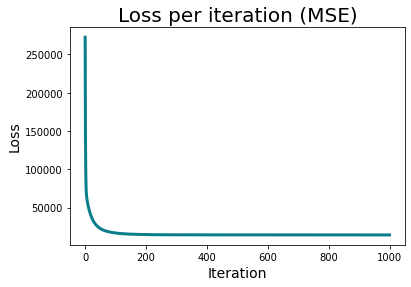

In [77]:
import matplotlib.pyplot as plt
xs = np.arange(len(model.loss))
ys = model.loss

plt.plot(xs, ys, lw=3, c='#087E8B')
plt.title('Loss per iteration (MSE)', size=20)
plt.xlabel('Iteration', size=14)
plt.ylabel('Loss', size=14)
plt.show()

In [79]:
ys

[272538.1964566929,
 142258.52649776143,
 94490.37551295794,
 75927.74352803681,
 67762.94132899628,
 63356.54074126517,
 60361.32797159007,
 57944.32452523081,
 55806.947006416194,
 53839.38907119054,
 51998.700809311784,
 50265.76945771533,
 48630.13039950579,
 47084.595135392345,
 45623.342699334535,
 44241.23351227201,
 42933.55519740041,
 41695.92149941878,
 40524.22590611682,
 39414.61522203755,
 38363.47079704904,
 37367.39303456402,
 36423.18760061077,
 35527.85274348393,
 34678.567484421226,
 33872.68056537818,
 33107.700086092824,
 32381.28378059388,
 31691.22989123731,
 31035.468602645382,
 30412.05400084085,
 29819.156525213974,
 29255.05588302373,
 28718.13439802196,
 28206.870766544842,
 27719.83419605588,
 27255.678902663232,
 26813.13894557606,
 26391.023377819194,
 25988.211693794885,
 25603.64955547347,
 25236.34478011367,
 24885.363573463088,
 24549.82699337613,
 24228.907629710753,
 23921.826487234885,
 23627.85005908736,
 23346.28757910383,
 23076.48844203586,
 228

printing y_hat [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0.]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  165

 3376.54256343 4059.45001102]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [2669.61959932 2945.46967473 2945.05483459 3049.

 23456.65163045 18419.23170253 21391.55667043]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [15284.13341657 16857.55023646 

 -171228.03089367 -136583.0697406  -157189.81623459]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-114649.10909056 -126448

 -1409657.42191959 -1122564.76791475 -1293156.06514898]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [ -941174.24345255 -10

 11234302.09160977  8943960.80750738 10304650.04021716]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [ 7497366.41234353  82

partial_w printing [51385473.0640977  56674178.10771668 56665545.97751609 58674292.01611399
 62573247.19283617 76357928.9294624 ]
partial_d printing 141503151.1161921
printing y_hat [-5.33033123e+07 -8.86162993e+07 -7.10146406e+07 -6.14978500e+07
 -6.86443016e+07 -6.51400283e+07 -6.19901308e+07 -9.25313376e+07
 -8.57204810e+07 -8.71323186e+07 -4.87593854e+07 -6.26544969e+07
 -6.05972202e+07 -6.05931805e+07 -6.07406030e+07 -8.20691085e+07
 -6.15712994e+07 -5.70185369e+07 -8.76857384e+07 -7.70457696e+07
 -8.12123963e+07 -6.52537520e+07 -9.71948780e+07 -8.58553763e+07
 -4.98142422e+07 -9.47635826e+07 -6.51988780e+07 -7.44626883e+07
 -8.39225567e+07 -9.34383259e+07 -9.80062150e+07 -7.02889000e+07
 -6.17475137e+07 -7.77034000e+07 -6.25525878e+07 -7.78569305e+07
 -6.74725781e+07 -8.73731477e+07 -5.80216152e+07 -6.70897912e+07
 -6.10685292e+07 -8.72721605e+07 -6.51794631e+07 -8.97376616e+07
 -8.56311105e+07 -8.49378859e+07 -8.63169424e+07 -5.76115515e+07
 -6.51897642e+07 -1.05122899e+08 -6.93

 -5.77526032e+08 -4.59799383e+08 -5.29742129e+08]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-3.85439547e+08 -4.25109828

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-3.16414574e+09 -3.48980654e+09 -3.48927500e+09 -3.61296684e+09
 -3.85305150e+09 -4.70186612e+09]
partial_d printing -8713291245.603998
printing y_hat [3.28223807e+09 5.45674444e+09 4.37286796e+09 3.78684159e+09
 4.22690154e+09 4.01111586e+09 3.81715597e+09 5.69782046e+09
 5.27842385e+09 5.36536383e+09 3.00242746e+09 3.85806521e+09
 3.73138337e+09 3.73112999e+09 3.74021154e+09 5.05358058e+09
 3.79136403e+09 3.51101487e+09 5.39943844e+09 4.74425336e+09
 5.00082306e+09 4.01812295e+09 5.98499307e+09 5.28673086e+09
 3.06738354e+09 5.83527894e+09 4.01473951e+09 4.58519213e+09
 5.16771291e+09 5.75367307e+09 6.03495657e+09 4.32817689e+09
 3.80221573e+09 4.78474864e+09 3.85179027e+09 4.79420291e+09
 4.15475554e+09 5.38019122e+09 3.57278273e+09 4.13117823e+09
 3.76040447e+09 5.37397314e+09 4.01354386e+09 5.52579020e+09
 5.27292060e+09 5.23023345e+09 5.31515148e+09 3.54753077e+09
 4.01417793e+09 6.47318987e+09 4.27320825e+09 

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [3.20617119e+10 3.53615733e+10 3.53561873e+10 3.66095342e+10
 3.90422683e+10 4.76431521e+10]
partial_d printing 88290191459.41121
printing y_hat [-3.32583202e+10 -5.52921878e+10 -4.43094695e+10 -3.83713736e+10
 -4.28304199e+10 -4.06439038e+10 -3.86785435e+10 -5.77349670e+10
 -5.34852987e+10 -5.43662451e+10 -3.04230522e+10 -3.90930695e+10
 -3.78094258e+10 -3.78068591e+10 -3.78988801e+10 -5.12070036e+10
 -3.84171988e+10 -3.55764728e+10 -5.47115174e+10 -4.80726485e+10
 -5.06724220e+10 -4.07149046e+10 -6.06448334e+10 -5.35694720e+10
 -3.10812401e+10 -5.91278079e+10 -4.06806216e+10 -4.64609108e+10
 -5.23634852e+10 -5.83009107e+10 -6.11511036e+10 -4.38566235e+10
 -3.85271570e+10 -4.84829797e+10 -3.90294865e+10 -4.85787781e+10
 -4.20993769e+10 -5.45164886e+10 -3.62023550e+10 -4.18604734e+10
 -3.81034913e+10 -5.44534819e+10 -4.06685063e+10 -5.59918166e+10
 -5.34295354e+10 -5.29969944e+10 -5.38574532e+10 -3.59464818e+10
 -4.0

partial_w printing [2.63200624e+11 2.90289807e+11 2.90245593e+11 3.00534553e+11
 3.20505325e+11 3.91111597e+11]
partial_d printing 724790789412.9033
printing y_hat [-2.73023807e+11 -4.53903976e+11 -3.63744773e+11 -3.14997825e+11
 -3.51602976e+11 -3.33653453e+11 -3.17519441e+11 -4.73957210e+11
 -4.39070883e+11 -4.46302738e+11 -2.49748557e+11 -3.20922362e+11
 -3.10384689e+11 -3.10363618e+11 -3.11119037e+11 -4.20367929e+11
 -3.15374012e+11 -2.92053958e+11 -4.49137143e+11 -3.94637418e+11
 -4.15979448e+11 -3.34236312e+11 -4.97844851e+11 -4.39761878e+11
 -2.55151745e+11 -4.85391303e+11 -3.33954876e+11 -3.81406359e+11
 -4.29861704e+11 -4.78603149e+11 -5.02000919e+11 -3.60027274e+11
 -3.16276680e+11 -3.98005904e+11 -3.20400398e+11 -3.98792331e+11
 -3.45601706e+11 -4.47536115e+11 -2.97191942e+11 -3.43640502e+11
 -3.12798729e+11 -4.47018881e+11 -3.33855420e+11 -4.59647360e+11
 -4.38613111e+11 -4.35062301e+11 -4.42125969e+11 -2.95091431e+11
 -3.33908163e+11 -5.38454116e+11 -3.55454862e+11 -2.6055

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [2.16066343e+12 2.38304363e+12 2.38268067e+12 2.46714467e+12
 2.63108850e+12 3.21070867e+12]
partial_d printing 5949943926209.919
printing y_hat [-2.24130378e+12 -3.72618313e+12 -2.98604926e+12 -2.58587640e+12
 -2.88637497e+12 -2.73902395e+12 -2.60657681e+12 -3.89080390e+12
 -3.60441548e+12 -3.66378313e+12 -2.05023288e+12 -2.63451204e+12
 -2.54800630e+12 -2.54783332e+12 -2.55403470e+12 -3.45087941e+12
 -2.58896459e+12 -2.39752588e+12 -3.68705130e+12 -3.23965280e+12
 -3.41485354e+12 -2.74380876e+12 -4.08690204e+12 -3.61008798e+12
 -2.09458867e+12 -3.98466852e+12 -2.74149840e+12 -3.13103655e+12
 -3.52881559e+12 -3.92894328e+12 -4.12101998e+12 -2.95553162e+12
 -2.59637476e+12 -3.26730533e+12 -2.63022714e+12 -3.27376126e+12
 -2.83710942e+12 -3.67390816e+12 -2.43970456e+12 -2.82100952e+12
 -2.56782360e+12 -3.66966209e+12 -2.74068194e+12 -3.77333164e+12
 -3.60065754e+12 -3.57150827e+12 -3.62949525e+12 -2.42246106e+12
 -2.7

printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-1.12970709e+13 -1.24597902e+13 -1.24578924e+13 -1.28995141e+13
 -1.37566976e

printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-7.74278987e+13 -8.53969473e+13 -8.53839403e+13 -8.84107286e+13
 -9.42856953e

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




partial_w printing [-2.17639511 -0.93890723 -0.89162115 -0.49287466 -0.46398452  0.05729413]
partial_d printing 1.902065888071999
printing y_hat [ -12.33061447  770.078661    388.17159314  163.22838353  228.71843412
  161.90100372  175.48682376  798.94481136  684.23653087  742.89746267
 -209.00627931  189.9848757   154.14460035   65.00690056  146.46068743
  618.48178537  158.26225362   74.88644432  705.29304712  513.9210664
  566.65078691  241.13498254  915.36757482  690.5303343  -184.10793254
  866.76576828  160.62256044  468.39186189  665.96972724  836.70287093
  971.60543616  351.9928922   168.8697326   526.57227632  188.60658792
  528.05358149  322.61630166  711.77244118   96.7742656   200.11179165
  152.67442054  714.67925473  156.43381651  730.1083221   682.50043216
  676.29572066  684.79339404   75.97776698  155.93257715 1148.94431203
  336.98260187 -160.39332225  551.7749783   224.20144141  796.06242162
  -41.38441178 -109.74665913  858.90483906  419.19894994 -185.62786185
  8

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-1.35931743 -0.49382153 -0.46195391 -0.1161664  -0.80102176  0.30235546]
partial_d printing 1.1156235392461449
printing y_hat [ -16.62032621  774.56807618  383.7219199   160.38658181  230.32648218
  163.07393787  171.62506432  800.68649089  682.43688007  746.92191977
 -208.68988734  186.85094718  149.73838733   65.41930844  143.25473191
  616.49587343  155.32141905   71.4621119   706.1602083   511.02495261
  566.63946788  237.65671033  918.10640807  689.00764356 -183.63840118
  869.15823093  161.72301671  464.42605214  669.7198866   836.38370037
  977.32636616  350.4018794   164.68259872  523.55486413  185.822698
  530.45626034  317.86987872  713.42769339   92.05534025  201.58832034
  149.4444792   713.20138786  157.58591601  730.6213995   680.69913754
  674.21457962  685.78861172   72.44406606  156.86271719 1156.60254794
  335.37521491 -159.74484875  554.47429197  225.68116893  797.86069329
  -47.32490006 -114.7391

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.92927354 -0.29530607 -0.27044839  0.05968737 -0.90572787  0.41490204]
partial_d printing 0.7159109496053512
printing y_hat [ -19.15894952  776.54385322  381.54022588  158.63824704  231.45757726
  163.94528417  169.94716983  801.38787651  681.99898175  748.47281951
 -208.16949156  184.65713335  147.48720528   65.89068921  141.19578694
  616.01687931  153.55414515   69.39573408  706.22982421  509.99362418
  566.36718717  236.14868139  919.20645465  688.80392413 -183.08455247
  870.06294641  162.54814331  462.35259459  671.38945112  836.99820313
  979.74702648  349.1730659   162.70068471  522.35458518  183.99958321
  531.36100854  315.54969327  714.17748497   89.73868948  202.65500522
  147.34147355  713.0038373   158.52158943  730.39873306  680.26509997
  673.42284637  685.99438094   70.37236878  157.57133618 1160.07880882
  334.15219037 -159.11318899  555.55498785  226.61884741  798.53685177
  -50.39047453 -117.66

  187.08652283  385.97905526]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.68275971 -0.20801121 -0.18630309  0.14509047

  186.36205098  385.1949024 ]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.53986232 -0.17591763 -0.15541098  0.18453014

partial_w printing [-0.45125199 -0.16738218 -0.14722573  0.20333469 -0.80319241  0.47889176]
partial_d printing 0.30230652855774415
printing y_hat [ -22.92160189  777.88730506  379.53415409  155.8696275   233.53329785
  165.67867876  169.23436348  801.32887966  683.06054715  748.73012326
 -206.45642069  180.37198873  145.17724907   67.17643883  137.65185933
  617.32394994  150.83304692   66.28346477  704.92002527  510.43831079
  565.10011163  235.4850545   919.27518952  690.46667383 -181.48343375
  869.88995844  164.18478478  460.0001414   672.64711336  840.12286747
  980.88086787  346.51457258  161.16611508  522.2265102   180.79680754
  531.49706911  313.52361265  714.66980685   87.68784381  204.71371083
  143.63124153  714.5675143   160.55016785  728.24763162  681.34584861
  673.42256637  685.14645373   67.3518797   158.95041196 1162.71598431
  331.5804441  -157.47251178  555.98909246  228.09228445  798.32424124
  -53.6340244  -121.91352583  862.68590292  414.87595896 -182.95926524
 

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.38374918 -0.16838176 -0.14822077  0.21445055 -0.73792284  0.4685002 ]
partial_d printing 0.2507282040045548
printing y_hat [ -23.68613773  777.96003613  379.33748399  155.2762238   234.00500241
  166.10310854  169.43981604  801.06078902  683.57550093  748.48509978
 -205.92015365  179.28272122  144.90490071   67.53872159  136.82756456
  617.97925738  150.25316179   65.65986565  704.33965797  510.90854036
  564.64730308  235.65004588  918.96718252  691.16812605 -181.00076689
  869.54787662  164.57908877  459.63555241  672.7711019   841.15465611
  980.72611293  345.80827011  161.11779358  522.50509237  180.04934964
  531.37225848  313.38124686  714.66165203   87.54128478  205.2092296
  142.74916318  715.21368355  161.06824026  727.36870095  681.86678689
  673.61688151  684.7354078    66.74607184  159.26480385 1162.91118616
  330.91650678 -156.9951117   555.94244564  228.3868269   798.01671655
  -54.04124221 -122.747

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.33747552 -0.17279855 -0.15249093  0.22090526 -0.68080906  0.45454765]
partial_d printing 0.21700006825370954
printing y_hat [ -24.27241773  778.01306668  379.21934561  154.81606279  234.36712364
  166.43847613  169.67122507  800.78841131  684.01954831  748.27119606
 -205.46822572  178.39607747  144.73539343   67.83261242  136.17087071
  618.56051323  149.80035541   65.19000355  703.81648207  511.34527793
  564.25108537  235.83615057  918.65906273  691.77372966 -180.5961643
  869.21874384  164.88760272  459.36884952  672.87632324  842.01537734
  980.56086456  345.23158512  161.13153112  522.7748268   179.45644727
  531.27410709  313.3246077   714.63809574   87.4847434   205.59976263
  142.04168132  715.76470966  161.48076411  726.57339007  682.31547267
  673.79313191  684.36649742   66.28248913  159.50255982 1163.04329354
  330.38073721 -156.59674635  555.91156913  228.60434512  797.71725037
  -54.30227787 -123.37

  184.60405962  382.68267406]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-0.29237905 -0.17930566 -0.15875971  0.22707227

printing y_hat [ -25.36430052  778.1758268   379.04051262  153.95131364  235.02400969
  167.07240467  170.24699519  800.13087362  684.91729075  747.88519982
 -204.54509682  176.63449467  144.49243351   68.40173744  134.89463095
  619.79018927  148.93682225   64.3426455   702.66986922  512.29953214
  563.40647621  236.29327516  917.93970995  693.01742794 -179.7731074
  868.47363807  165.46197899  458.87558191  673.15804062  843.7296619
  980.22222764  344.08971614  161.24828392  523.37118854  178.31455087
  531.1379504   313.31219498  714.57198277   87.48667239  206.33802399
  140.65568286  716.87469353  162.26663726  724.80741948  683.2206666
  674.14885829  683.57014897   65.41979913  159.92055029 1163.34908994
  329.3370682  -155.78845364  555.92155013  228.98025775  797.0231776
  -54.69171056 -124.53443177  866.33204372  412.58148433 -181.17996467
  841.11742979  -41.04617074  -71.59253685  221.36952327  277.67514631
  404.06179991  474.64899185  681.46889467  765.42413859  250.8542

partial_d printing -393.9394276865259
printing y_hat [135.99732083 249.69847054 199.73433085 162.92672605 180.23356311
 168.81204222 167.26796164 264.55030541 247.88052717 244.8515928
 112.15678179 166.7069044  162.74897364 153.87877783 160.41486136
 236.03841161 163.09606341 148.29672933 248.72518005 219.5583051
 227.47263738 177.9360278  280.04913277 248.37720643 115.64291752
 272.1001198  168.97369651 211.1162689  234.24807528 273.12692768
 280.52519298 191.79352011 166.43433348 221.68707253 166.40912334
 214.21698316 188.22038617 247.8921147  154.2750842  175.1801753
 161.47804669 252.95643679 168.87747159 255.2254588  247.59075623
 245.38312481 244.34139125 150.11665591 168.88611097 304.20673321
 188.91121296 119.11715223 217.31291356 178.44189059 262.71062886
 132.50793046 120.19397036 275.68379943 201.42831101 116.05779919
 268.72741894 133.77715053 132.77613822 172.96473416 181.49575572
 206.44884481 214.13626821 244.16157322 256.16875863 181.45070905
 134.79076853 150.07528843

printing y_hat [251.18805103 537.68308427 427.14371381 320.22975859 349.97923893
 320.98146206 337.43768426 579.71393225 549.99366129 525.37309924
 169.22499544 329.90761427 326.07215348 282.7190606  313.73891093
 520.0904595  320.4435992  282.9898492  539.45967882 477.93090861
 485.01127202 364.6256564  619.98981884 551.41172646 178.22945487
 599.73237814 321.30307861 456.50236763 497.97775644 614.33392672
 616.66290238 394.20003246 335.21363839 483.30922213 329.22445527
 446.33492018 397.9956637  537.85999512 304.29999024 337.18747429
 316.42693375 562.92710365 320.94634315 555.41963849 549.26078404
 543.8454153  528.55015257 287.26284891 320.91155813 678.25376012
 386.96020642 187.17052372 454.41118968 345.6147409  575.3308499
 248.61070434 210.88668301 621.08516661 419.05817337 179.14051194
 590.84121076 252.06133792 221.96636102 346.00586192 367.88349457
 417.00467114 464.02340372 528.03839858 558.98258394 353.3640565
 233.81310298 287.39596611 283.76283481 607.34397224 335.133273

printing y_hat [222.11735203 573.0934318  449.70612916 307.54563109 332.0077168
 296.44917683 333.48533625 627.45003293 601.00761057 558.02030116
 103.42097251 319.55520995 319.71606295 249.12878972 299.47665999
 564.50716329 307.55819245 261.76688029 578.02207019 512.45374481
 510.67110386 366.95161641 677.91313109 602.90900959 114.64569086
 652.98486815 296.74521318 486.2586521  523.84164195 680.14574822
 670.79834313 399.0600445  330.65867795 519.03747198 318.76822397
 459.62565353 414.05026325 576.5977589  292.70587593 316.3631492
 302.76597887 616.910009   296.1669553  597.00062104 600.11028041
 593.71867081 564.87985006 266.60573476 296.07914862 747.98549438
 390.26636547 125.75019665 469.77164656 326.8858371  622.40739419
 223.94411279 172.49126117 688.72551038 429.99859107 115.59777666
 641.65675976 228.44516773 168.56536591 339.50189061 366.59665309
 414.73979279 495.26640613 564.17533624 602.65849197 336.49052746
 188.65392449 267.05694072 262.19546607 672.29088792 314.007616

printing y_hat [189.66361915 591.76123208 456.91066247 287.88386167 307.93639349
 267.36180991 320.16145501 654.59795933 630.1531361  574.607045
  42.28413265 301.76973065 304.65203433 212.97516339 278.58832868
 588.65171043 287.65378748 235.53459879 598.15193695 528.91897837
 520.71451859 358.4798781  713.2356824  632.46520679  55.27623865
 684.70532884 267.60706497 499.17542274 535.00176067 720.65578921
 704.1130489  393.11770527 316.86051453 536.43689936 300.89208777
 460.8742343  416.30090078 597.00176359 273.51398219 290.12303742
 282.3403159  648.33118821 266.79983476 619.25890045 629.12888839
 622.10570541 583.36981014 240.66413288 266.67330256 793.7860148
 383.16073662  68.08595459 472.68250955 302.33226524 649.16892568
 194.6058847  132.83481092 730.741487   428.86543634  56.2003816
 671.32256901 200.01117446 117.09421086 324.69969215 355.89129989
 402.87074148 509.20329339 582.47900912 626.92337695 313.36953613
 143.48404194 241.47213581 235.54062194 712.40294552 287.58605373

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 7.94796482e+01  6.65937790e+02  4.56899098e+02  2.20179579e+02
  2.38961075e+02  1.82609584e+02  2.61258803e+02  7.39455138e+02
  7.00633659e+02  6.42584366e+02 -1.39602121e+02  2.40910944e+02
  2.41238918e+02  1.04786898e+02  2.06913783e+02  6.43719241e+02
  2.18421062e+02  1.46795045e+02  6.60958390e+02  5.58877760e+02
  5.49838720e+02  3.15309632e+02  8.27145136e+02  7.04539044e+02
 -1.20433095e+02  7.87017868e+02  1.82438083e+02  5.19011499e+02
  5.83734338e+02  8.27208725e+02  8.27293201e+02  3.71264893e+02
  2.56418614e+02  5.69495324e+02  2.39557656e+02  4.75910777e+02
  4.00865227e+02  6.61716222e+02  1.96017023e+02  2.14425915e+02
  2.12163601e+02  7.25988643e+02  1.80366502e+02  6.87311848e+02
  6.99194105e+02  6.91258419e+02  6.41544106e+02  1.51616487e+02
  1.80190854e+02  9.60988698e+02  3.57845428e+02 -1.01815041e+02
  4.93616226e+02  2.32723690e+02  7.33825680e+02  8.39388530e+01
 -6.38504397e-01  8.42965494e+02  4.23516560e+02 -1.20110048e+02
  7.65392827e+02  9.30770

printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [ -4.3713877  -13.48892933 -13.25539368 -11.76853653   1.10510888
  -9.9481187

  235.36525336  404.00256877]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [ -5.62989907 -12.04435157 -11.81150463 -10.3845

partial_w printing [ -6.4937528  -10.81735981 -10.58796516  -9.22135386   2.25139985
  -7.30157677]
partial_d printing 17.6987906892144
printing y_hat [  53.66175161  689.54301339  447.50068596  204.30125798  228.802792
  169.12774659  242.17561553  758.05614422  706.76142815  665.02193455
 -171.71635201  226.86552955  221.60719638   85.83527054  190.13910546
  646.74839832  201.88465431  126.32439746  674.91274648  556.1917374
  555.84632249  299.74382015  853.33123079  711.14400277 -150.97740745
  810.64324746  168.75375264  514.61155628  601.17999867  841.09935246
  862.49589034  366.22218561  236.97825545  567.52367437  225.34465233
  485.14068735  388.29172351  676.56017957  172.94186011  202.89741409
  195.72021617  733.64207445  166.18232051  701.71862786  705.22777205
  697.55710486  654.76293735  130.5436574   166.01850522 1007.56773471
  352.16234131 -130.94097212  504.3858116   222.81247091  752.8295803
   53.31484691  -31.64188783  858.46130843  422.55674    -151.00585297
 

  227.8226732   401.94111041]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-7.01313054 -9.86759854 -9.64296065 -8.32995933

  224.66607712  401.04060345]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-7.36635403 -8.97602366 -8.75772409 -7.50121205

printing y_hat [ 44.72062465  80.72329048  64.60515125  53.22396964  58.96322619
  55.35203589  54.47676207  85.33071647  79.8173099   79.19112709
  37.58631112  54.41825567  53.04657579  50.63622976  52.43181381
  76.07032928  53.28103619  48.59989496  80.32864606  70.86505187
  73.61701723  57.84811129  90.21596503  79.9716278   38.68607591
  87.70393233  55.40463103  68.1964484   75.84600523  87.79527914
  90.45848855  62.33996373  54.2151505   71.53869984  54.32264046
  69.52568784  60.96327512  80.05636323  50.37144716  57.36483039
  52.76820009  81.42133611  55.37595226  82.39302696  79.72563038
  79.02478831  78.93885269  49.18098625  55.37977717  97.92177693
  61.42733105  39.78258516  70.50095511  58.39387816  84.74436282
  43.49632811  39.72692854  88.59946672  65.37974624  38.81956674
  86.64255086  43.89394724  44.09937909  56.39308214  59.08692842
  67.24419081  69.15330563  78.8827916   82.67171256  59.34318002
  44.608413    49.16412603  48.76322866  86.83870835  57.0877

 129.56715158 153.4979432 ]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [-128.82886434 -280.237919   -280.54076186 -287.22

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [ -79.88360145 -222.99784718 -223.29154264 -227.96066097 -228.86316516
 -286.73222875]
partial_d printing -327.86505063026283
printing y_hat [151.70191611 280.38946243 224.23272154 182.21184673 201.45494161
 188.52122224 187.28615632 297.32320222 278.76758202 274.90052854
 124.16874983 186.49388764 182.17088584 171.60299391 179.36468618
 265.36138109 182.39877281 165.64271941 279.40094775 246.69208613
 255.32375508 199.36890126 314.89473246 279.33369826 128.11983292
 305.89157905 188.7022568  237.13177257 262.88283207 307.36235975
 315.31333135 214.9156216  186.33953454 249.10194519 186.15860175
 240.18188601 211.19632012 278.46961536 172.5694134  195.73336665
 180.56833065 284.51666802 188.59087312 286.74939761 278.43952504
 275.94358101 274.441842   167.69582584 188.5992104  342.163361
 211.65349509 132.05673377 243.69260929 199.43002546 295.24638667
 147.91063834 133.80222236 310.26355585 225.8349358  128.58646975

printing y_hat [188.4353353  353.57853584 282.61073733 227.67497082 251.40293121
 234.78668857 234.63595916 375.65461224 352.71292661 346.52591874
 151.56201119 233.18025999 228.07015478 213.0292763  224.00948662
 335.50040046 227.90140089 206.38217381 352.6241702  311.49502507
 321.66083981 250.16531332 398.28786863 353.45060693 156.64769055
 386.7164905  235.0135389  299.21133613 331.05719076 389.46555996
 398.49075065 269.73304034 233.41244999 314.58894444 232.75485458
 301.8424186  265.86815975 351.46163168 215.71884222 244.05477398
 225.55498867 360.10208274 234.86353816 362.02963034 352.29168345
 349.09647531 346.26749122 208.99776744 234.87021111 433.07939886
 265.54719049 161.7131326  306.36659826 248.81281039 373.00474362
 184.01175682 165.42784999 393.2092555  283.7865554  157.23817267
 381.78105066 185.87909237 181.59494698 242.30487696 254.73562488
 289.58454843 303.59288933 346.00122722 363.51164688 253.20109595
 185.21845138 208.95912543 207.05230124 385.16573252 242.8056

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [ -16.74376863 -147.01853338 -147.2892124  -149.28776118 -144.60356097
 -184.45546249]
partial_d printing -145.8266107190289
printing y_hat [208.96848427 397.08840798 317.23483834 253.74520631 279.89910711
 260.95493943 262.07887461 422.54335043 397.19510801 389.04706976
 165.57278326 260.02579751 254.59889963 236.12878528 249.55919462
 377.58095343 253.99064826 229.46367273 396.2815487  350.19350537
 360.95163709 279.78983216 448.4019371  398.04565319 171.37991802
 435.2049484  261.20828545 336.1880408  371.38382048 439.11163185
 448.33439768 301.73534284 260.67726111 353.71905237 259.54556894
 338.02952625 298.15175395 394.98730523 240.50220067 271.52376116
 251.32046771 405.62236529 261.03081567 406.97222319 396.71504207
 393.08289656 389.04754279 232.42525519 261.03478891 487.8556385
 296.96773211 177.16208947 343.20035785 276.95670448 419.53915837
 204.32768444 182.72715469 443.39507641 317.78110804 172.0447678


 282.40568256 339.78225168]
printing y [  51.5  567.   340.   120.   160.   120.   145.   820.   720.   500.
    7.5  110.   140.    69.   110.   620.   130.    85.   685.   500.
  514.   200.  1000.   714.     8.7 1000.   110.   430.   456.   925.
  950.   250.   170.   475.   145.   300.   242.   650.   120.   145.
  125.   850.     0.   840.   725.   680.   690.    80.   120.  1600.
  265.    12.2  345.   160.   850.    55.    32.   975.   320.     9.7
 1100.    60.    19.7  145.   197.   272.   450.   700.   820.   161.
   40.    85.   100.   950.   140.   390.   150.   273.   900.   556.
  130.   115.  1550.  1650.   135.   450.   700.   340.   800.   540.
  363.   700.    87.     5.9  770.   500.   430.    90.   390.   300.
  200.    12.2  540.   169.   130.   685.   306.     9.8  300.    78.
    9.8  290.   290.   300.   260.   180.   900.   120.    40.  1015.
   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [   0.28915967 -125.61432302 -125.87405752 -127.12

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [  13.97070921 -107.79019856 -108.03786331 -108.66627062 -100.99232555
 -131.68552389]
partial_d printing -54.38568374723971
printing y_hat [234.60868924 458.02233551 365.50741059 287.96700179 316.95460877
 294.42067981 298.81238835 488.96303702 460.7086176  448.45609889
 179.78480536 295.44837909 289.92969706 264.83996756 282.97103976
 437.40146771 288.22786511 259.0705164  457.71346063 404.77824053
 415.61850092 319.89411411 519.85479915 461.74328133 186.71434064
 504.14616683 294.70917806 388.11812252 427.37825047 510.60365349
 519.08128015 345.1484744  297.12924417 408.96770538 294.88825445
 387.59008396 342.82057612 456.24919018 273.124925   306.99774239
 285.06432431 470.73963933 294.48210583 470.35109091 460.13802297
 455.84432682 449.14072464 262.54327892 294.47829433 566.30305444
 339.48877046 193.60948625 393.77196838 313.48084752 485.43095866
 230.03411242 203.36914083 515.73611428 364.29187987 187.4847184

printing y_hat [242.62582069 481.27419786 383.7912025  299.72634451 329.48122392
 305.39153858 311.85860246 514.72737953 485.61841418 471.04711318
 182.15280312 307.73121479 302.37197726 273.73826227 294.37558901
 460.71623711 299.98644903 268.82647064 481.31367983 425.81299841
 436.26982172 334.40477809 547.8323887  486.73815974 189.57409833
 531.03262865 305.69224024 408.00304066 448.47284509 538.97934392
 546.61076064 360.91482184 310.04990173 430.28941152 307.13875853
 405.86936144 359.54538732 479.79309724 284.38458414 318.84024286
 296.61241454 496.34601389 305.43972838 494.77660838 485.00867037
 480.43498736 472.16822227 272.50880584 305.4307208  597.22014145
 354.87114376 196.95574928 412.49681941 325.78363732 510.97642685
 238.28181052 209.21395393 544.48870736 381.41435249 190.38530588
 523.77560004 241.06078299 225.81636719 321.02759518 339.11762694
 384.98333625 414.31087831 471.7652921  497.2960051  332.18141109
 233.27863928 272.52741243 269.64719695 532.93820403 317.0772

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [ 32.45591014 -81.7019234  -81.92291452 -81.64967185 -71.88469448
 -96.63119572]
partial_d printing 3.788836333832139
printing y_hat [247.58922624 499.27711407 397.84149658 307.91521928 338.04724046
 312.62282523 321.27078881 534.96456782 505.36662089 488.48319325
 181.84471356 316.37141199 311.26879157 279.18366005 302.25771805
 479.09949096 308.16984653 275.29441197 499.69267939 442.23315133
 452.10777341 345.07572777 569.98911476 506.56271233 189.69138063
 552.25154928 312.93204819 423.43744513 464.61420176 561.70614161
 568.29978458 372.55681538 319.35217168 446.95531406 315.75256929
 419.57797043 372.25998297 498.1348164  292.26091435 326.82016629
 304.61749067 516.69278204 312.6551098  513.85181126 504.72333715
 499.91392545 490.06063186 279.14878844 312.64054548 621.84797581
 366.18540722 197.4931202  426.59246637 334.16188541 531.03225881
 243.56474424 212.30967121 567.54466929 394.22864857 190.53443362
 544.

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




partial_w printing [ 45.84679368 -54.17576951 -54.3333107  -53.14195091 -40.87710579
 -59.78369296]
partial_d printing 56.785765031662365
printing y_hat [248.32035092 545.26276804 432.51805524 320.01404713 349.10770539
 319.03782152 338.59039648 589.31262562 559.99721128 532.49924944
 160.67197242 330.06579851 326.82431763 279.30888844 313.26806925
 529.01106467 320.20354674 281.38276688 547.56052991 485.24630653
 491.02443308 366.79960551 631.21620839 561.48956981 170.03272656
 610.19849187 319.35842951 463.03253711 504.0171803  626.7492137
 627.27178857 396.82257523 336.27013328 490.82111253 329.36548009
 450.34927419 402.3040595  545.97378728 304.20752906 335.8484683
 316.05430236 573.41485106 318.97082079 564.0324114  559.23750137
 553.65268959 536.27896345 285.76193455 318.92797651 691.3558932
 389.32622293 179.32245116 458.75579038 344.61077117 584.8103987
 246.3973758  206.50228793 633.78889756 422.65879564 170.95617557
 600.92578891 250.01014644 215.42320481 346.78756903 369.5

   19.9  575.   300.   250.   600.   150.   300. ]
partial_w printing [ 46.07536719 -51.55441946 -51.69995558 -50.42737581 -37.87916045
 -56.30077494]
partial_d printing 60.384233827219774
printing y_hat [246.14650598 550.08808987 435.88859393 319.61794271 348.24227976
 317.45497783 339.11987103 595.4910924  566.46794739 537.02129069
 154.64737893 329.92069363 327.08664061 276.74304316 312.70088225
 534.75774136 319.79012344 280.05512675 552.7365136  489.91742224
 494.80092393 368.01301628 638.48833148 568.0106086  164.2473331
 616.961503   317.77452349 467.1788741  507.80944359 634.83462408
 634.12781576 398.32916541 336.7349205  495.6237502  329.20895616
 452.78284491 404.96161604 551.16039515 303.90330803 334.67038458
 315.55283288 580.20972521 317.3656265  569.54866545 565.69027931
 559.99324085 541.20688001 284.5036862  317.31729177 699.88703219
 390.66147587 173.77095252 461.41132059 343.65774829 590.91050817
 244.67207098 203.31266869 642.06857234 424.82175847 165.17838967
 607.

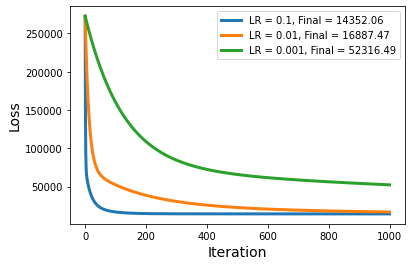

In [78]:
losses = {}
for lr in [0.5, 0.1, 0.01, 0.001]:
    model = LinearRegression(learning_rate=lr)
    model.fit(X_train, y_train)
    losses[f'LR={str(lr)}'] = model.loss
    
    
xs = np.arange(len(model.loss))

# plt.plot(xs, losses['LR=0.5'], lw=3, label=f"LR = 0.5, Final = {losses['LR=0.5'][-1]:.2f}")
plt.plot(xs, losses['LR=0.1'], lw=3, label=f"LR = 0.1, Final = {losses['LR=0.1'][-1]:.2f}")
plt.plot(xs, losses['LR=0.01'], lw=3, label=f"LR = 0.01, Final = {losses['LR=0.01'][-1]:.2f}")
plt.plot(xs, losses['LR=0.001'], lw=3, label=f"LR = 0.001, Final = {losses['LR=0.001'][-1]:.2f}")
# plt.title('Loss per iteration (MSE) for different learning rates with python decimal operations', size=20)
plt.xlabel('Iteration', size=14)
plt.ylabel('Loss', size=14)
plt.legend()
plt.savefig("python-mse.pdf")
plt.show()

In [55]:
# model = LinearRegression(learning_rate=0.5)
# model.fit(X_train, y_train)
# preds = model.predict(X_test)

# model._mean_squared_error(y_test, preds)

partial_w printing [-42.51516313  -9.17570144 -36.31033233 -36.87300839 -51.72117334
 -24.93585435]
partial_d printing -76.78308157099698
partial_w printing [56.06105694 16.39231051 40.67989938 43.62160833 62.57653543 25.67789952]
partial_d printing 96.73051668626094
partial_w printing [-65.93340028 -15.64890485 -53.61143225 -55.43187123 -78.13309678
 -36.51106488]
partial_d printing -117.37352943998378
partial_w printing [84.04720255 23.3872953  63.17397011 66.83906408 95.5031651  40.34055044]
partial_d printing 146.39186523867752
partial_w printing [-101.20620745  -25.14841062  -80.31946554  -83.75196131 -118.40072807
  -54.23289148]
partial_d printing -178.93303141400082
partial_w printing [126.85670761  34.31819947  96.99516878 102.02137756 145.43045024
  62.50732901]
partial_d printing 221.97901671607931
partial_w printing [-154.56946936  -39.31856148 -121.22887901 -126.88274264 -179.69741328
  -81.27054391]
partial_d printing -272.38629588117544
partial_w printing [192.12872116  

partial_w printing [4.37205942e+22 1.14230103e+22 3.39392390e+22 3.55829187e+22
 5.05379097e+22 2.23544970e+22]
partial_d printing 7.682412111927567e+22
partial_w printing [-5.38979853e+22 -1.40820877e+22 -4.18397013e+22 -4.38660009e+22
 -6.23022527e+22 -2.75582337e+22]
partial_d printing -9.470743521492071e+22
partial_w printing [6.64444952e+22 1.73601518e+22 5.15792532e+22 5.40772401e+22
 7.68051293e+22 3.39733093e+22]
partial_d printing 1.167536726005955e+23
partial_w printing [-8.19116136e+22 -2.14012921e+22 -6.35860028e+22 -6.66654774e+22
 -9.46840225e+22 -4.18817025e+22]
partial_d printing -1.4393188913619188e+23
partial_w printing [1.00979207e+23 2.63831392e+22 7.83877141e+22 8.21840366e+22
 1.16724810e+23 5.16310317e+22]
partial_d printing 1.7743671996667764e+23
partial_w printing [-1.24485404e+23 -3.25246734e+22 -9.66350054e+22 -1.01315045e+23
 -1.43896308e+23 -6.36498344e+22]
partial_d printing -2.1874089044118955e+23
partial_w printing [1.53463432e+23 4.00958495e+22 1.191299

partial_w printing [-1.87246383e+41 -4.89224220e+40 -1.45354834e+41 -1.52394379e+41
 -2.16443553e+41 -9.57397488e+40]
partial_d printing -3.2902203265576757e+41
partial_w printing [2.30834071e+41 6.03107077e+40 1.79190902e+41 1.87869130e+41
 2.66827834e+41 1.18026291e+41]
partial_d printing 4.0561261733990975e+41
partial_w printing [-2.84568213e+41 -7.43499874e+40 -2.20903415e+41 -2.31601783e+41
 -3.28940695e+41 -1.45500751e+41]
partial_d printing -5.000321529149973e+41
partial_w printing [3.50810725e+41 9.16573664e+40 2.72325874e+41 2.85514635e+41
 4.05512345e+41 1.79370785e+41]
partial_d printing 6.164309078661533e+41
partial_w printing [-4.32473336e+41 -1.12993601e+41 -3.35718582e+41 -3.51977457e+41
 -4.99908539e+41 -2.21125172e+41]
partial_d printing -7.599252607207554e+41
partial_w printing [5.33145578e+41 1.39296539e+41 4.13868007e+41 4.33911664e+41
 6.16278519e+41 2.72599251e+41]
partial_d printing 9.368225935985981e+41
partial_w printing [-6.57252561e+41 -1.71722341e+41 -5.1020

partial_w printing [-4.27546980e+61 -1.11706477e+61 -3.31894371e+61 -3.47968039e+61
 -4.94214020e+61 -2.18606308e+61]
partial_d printing -7.512688587818772e+61
partial_w printing [5.27072452e+61 1.37709795e+61 4.09153586e+61 4.28968923e+61
 6.09258415e+61 2.69494040e+61]
partial_d printing 9.261511324236925e+61
partial_w printing [-6.49765716e+61 -1.69766230e+61 -5.04397397e+61 -5.28825398e+61
 -7.51083137e+61 -3.32227547e+61]
partial_d printing -1.14174294603462e+62
partial_w printing [8.01019830e+61 2.09284845e+61 6.21812304e+61 6.51926718e+61
 9.25922177e+61 4.09564319e+61]
partial_d printing 1.407520769756461e+62
partial_w printing [-9.87483262e+61 -2.58002703e+61 -7.66559352e+61 -8.03683876e+61
 -1.14146069e+62 -5.04903742e+61]
partial_d printing -1.7351670305268071e+62
partial_w printing [1.21735212e+62 3.18061227e+61 9.45000986e+61 9.90767450e+61
 1.40717281e+62 6.22436518e+61]
partial_d printing 2.1390836203064824e+62
partial_w printing [-1.50073044e+62 -3.92100328e+61 -1.16498

partial_w printing [-3.42667644e+82 -8.95297994e+81 -2.66004597e+82 -2.78887219e+82
 -3.96099521e+82 -1.75207199e+82]
partial_d printing -6.021222047973045e+82
partial_w printing [4.22434689e+82 1.10370774e+82 3.27925823e+82 3.43807294e+82
 4.88304574e+82 2.15992375e+82]
partial_d printing 7.42285741398451e+82
partial_w printing [-5.20770109e+82 -1.36063163e+82 -4.04261230e+82 -4.23839629e+82
 -6.01973353e+82 -2.66271629e+82]
partial_d printing -9.150769021529937e+82
partial_w printing [6.41996298e+82 1.67736291e+82 4.98366186e+82 5.22502095e+82
 7.42102240e+82 3.28255016e+82]
partial_d printing 1.1280908283060109e+83
partial_w printing [-7.91441828e+82 -2.06782372e+82 -6.14377133e+82 -6.44131460e+82
 -9.14850685e+82 -4.04667052e+82]
partial_d printing -1.3906906773780359e+83
partial_w printing [9.75675667e+82 2.54917697e+82 7.57393403e+82 7.94074018e+82
 1.12781195e+83 4.98866477e+82]
partial_d printing 1.7144191864855318e+83
partial_w printing [-1.20279593e+83 -3.14258087e+82 -9.3370

8.389460157492966e+184

In [15]:
# from sklearn.linear_model import LinearRegression
# from sklearn.metrics import mean_squared_error

# lr_model = LinearRegression()
# lr_model.fit(X_train, y_train)
# lr_preds = lr_model.predict(X_test)

# mean_squared_error(y_test, lr_preds)

In [16]:


X_train_num = np.dot(X_train,1000).astype(int)
X_test_num = np.dot(X_test,1000).astype(int)
y_train_num = y_train
y_test_num = y_test

In [17]:
model = LinearRegression()
model.fit(X_train_num, y_train)
preds = model.predict(X_test_num)
mean_squared_error(y_test, preds)

partial_w printing [-1826.49858357  -114.76487252 -4959.59773371 -3700.74220963
 -1317.86968839  -904.34560907  3059.09348442 -3329.86402266
 -4461.96033994 -3497.65439093]
partial_d printing -307.4730878186969
partial_w printing [ 318341.65226525  205429.74726127  586961.42491345  487357.49744689
  446179.6098545   424341.82106878 -463082.77993981  643209.95555217
  645730.33379868  568717.4388752 ]
partial_d printing 329.0319870956346
partial_w printing [-5.58294117e+07 -4.25535512e+07 -9.01455617e+07 -7.59793310e+07
 -9.10070111e+07 -8.97219525e+07  7.65421681e+07 -1.17075049e+08
 -1.07679023e+08 -9.50986222e+07]
partial_d printing -84913.73755478465
partial_w printing [ 9.80244989e+09  7.66697928e+09  1.52382092e+10  1.28141898e+10
  1.67940173e+10  1.66748282e+10 -1.31632989e+10  2.08406661e+10
  1.86958222e+10  1.64158241e+10]
partial_d printing 13493882.484309364
partial_w printing [-1.72461719e+12 -1.35172834e+12 -2.65309856e+12 -2.22571095e+12
 -3.00695092e+12 -2.99010352e+12 

<ipython-input-6-e42b4d11c682>:22: RuntimeWarning: overflow encountered in double_scalars
  error += (y[i] - y_hat[i]) ** 2


partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d print

partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d print

partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d print

partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d print

partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d printing nan
partial_w printing [nan nan nan nan nan nan nan nan nan nan]
partial_d print

NameError: name 'mean_squared_error' is not defined